# **Fine-Grained Image Classification with CUB-200-2011 and eBird Datasets**

In this notebook, the [ConvNeXt V2 Large](https://huggingface.co/facebook/convnextv2-large-22k-384) model is optimized using the [CUB-200-2011](https://www.vision.caltech.edu/datasets/cub_200_2011/) dataset for fine-grained image classification. This improvement is achieved by adding nearly 20,000 images from the [eBird](https://ebird.org/home) website to the CUB-200-2011 training dataset, providing approximately 100 additional images per class. This approach results in better performance compared to the model fine-tuned in the notebook [Fine-Grained_ImageClassification_ConvNeXTV2_CUB-200-2011](https://github.com/JersonGB22/ImageClassification-TensorFlow/blob/main/VisionTransformerModels/Fine-Grained_ImageClassification_ConvNeXTV2_CUB-200-2011.ipynb). Fine-grained image classification is a more specialized and challenging task compared to conventional image classification, as it focuses on distinguishing between visually similar classes, such as different dog breeds or bird species, where the differences between classes are subtle. Therefore, a large amount of training data is necessary to achieve good results.

The [ConvNeXt V2](https://huggingface.co/docs/transformers/model_doc/convnextv2) model is a pure convolutional neural network, pretrained using the FCMAE (Fully Convolutional Masked Autoencoder) framework. This framework is a convolutional-based approach for masked autoencoders (MAE), a mechanism typically using Transformer architectures. In MAE, a significant portion of the input (images) is masked during training, and the model learns to reconstruct the missing parts from the visible information, forcing the model to capture robust and generalizable features.

Additionally, ConvNeXt V2 introduces an extra layer called Global Response Normalization (GRN) to the original [ConvNeXt](https://huggingface.co/docs/transformers/model_doc/convnext) architecture. This layer helps improve the consistency and stability of the model's output by normalizing the response of neurons across the entire image, allowing for better generalization in complex computer vision tasks. The model has been fine-tuned with the [ImageNet-22K](https://www.image-net.org/) dataset at a resolution of 384x384 pixels, providing a solid foundation for high-precision classification tasks.


## **Imports**

In [ ]:
import tensorflow as tf
from transformers import AutoImageProcessor, TFAutoModelForImageClassification
from transformers import create_optimizer
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, f1_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from google.colab import drive
import os

## **Parameters**

In [ ]:
drive.mount("/content/drive/")

Mounted at /content/drive/


In [ ]:
epochs = 5
batch_size = 32
buffer_size = 1024
AUTOTUNE = tf.data.AUTOTUNE
SEED = 123
model_name = "facebook/convnextv2-large-22k-384"

## **Prepare the datasets for training**

### **Load the datasets**

The preprocessing of the CUB-200-2011 and eBird datasets was completed in the notebook [Preprocessing_CUB-200-2011_eBird](https://github.com/JersonGB22/ImageClassification-TensorFlow/blob/main/Preprocessing/Preprocessing_CUB-200-2011_eBird.ipynb). In this notebook, we will only decompress the data, which is already prepared for training.

In [ ]:
# Paths to the ZIP files for each dataset
path_cub = "/content/drive/MyDrive/Datasets/CUB_200_2011.zip"
path_ebird = "/content/drive/MyDrive/Datasets/eBird.zip"

In [ ]:
# Extract the ZIP files
!unzip -q $path_cub
!unzip -q $path_ebird

In [ ]:
# Load the metadata for the datasets
df_cub = pd.read_csv("/content/CUB_200_2011/metadata_cub-200-2011.csv")
df_ebird = pd.read_csv("/content/eBird/metadata_ebird.csv")

# Find the class names
class_names = df_cub.sort_values(by="label").name.unique().tolist()
num_classes = len(class_names)

print("Number of classes:", num_classes)
print("Class names:", class_names)

Number of classes: 200
Class names: ['Black footed Albatross', 'Laysan Albatross', 'Sooty Albatross', 'Groove billed Ani', 'Crested Auklet', 'Least Auklet', 'Parakeet Auklet', 'Rhinoceros Auklet', 'Brewer Blackbird', 'Red winged Blackbird', 'Rusty Blackbird', 'Yellow headed Blackbird', 'Bobolink', 'Indigo Bunting', 'Lazuli Bunting', 'Painted Bunting', 'Cardinal', 'Spotted Catbird', 'Gray Catbird', 'Yellow breasted Chat', 'Eastern Towhee', 'Chuck will Widow', 'Brandt Cormorant', 'Red faced Cormorant', 'Pelagic Cormorant', 'Bronzed Cowbird', 'Shiny Cowbird', 'Brown Creeper', 'American Crow', 'Fish Crow', 'Black billed Cuckoo', 'Mangrove Cuckoo', 'Yellow billed Cuckoo', 'Gray crowned Rosy Finch', 'Purple Finch', 'Northern Flicker', 'Acadian Flycatcher', 'Great Crested Flycatcher', 'Least Flycatcher', 'Olive sided Flycatcher', 'Scissor tailed Flycatcher', 'Vermilion Flycatcher', 'Yellow bellied Flycatcher', 'Frigatebird', 'Northern Fulmar', 'Gadwall', 'American Goldfinch', 'European Goldfi

Next, the training DataFrame is created by concatenating the CUB-200-2011 training DataFrame with the eBird DataFrame, and the test DataFrame is generated using only the CUB-200-2011 test DataFrame.

In [ ]:
df_train = pd.concat([df_cub[df_cub.split == 1][["image", "label"]], df_ebird])
df_train = df_train.sample(frac=1, random_state=SEED)

df_test = df_cub[df_cub.split == 0][["image", "label"]]

del df_cub, df_ebird #Delete the unnecessary DataFrames to free up storage space

In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 25989 entries, 12513 to 13972
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   25989 non-null  object
 1   label   25989 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 609.1+ KB


In [ ]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5794 entries, 0 to 11785
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   5794 non-null   object
 1   label   5794 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 135.8+ KB


In [ ]:
# Create the training and testing datasets
train_dataset = tf.data.Dataset.from_tensor_slices((df_train.image.values, df_train.label.values))
test_dataset = tf.data.Dataset.from_tensor_slices((df_test.image.values, df_test.label.values))

del df_train, df_test
len(train_dataset), len(test_dataset)

(25989, 5794)

In [ ]:
# View an example from the training dataset
for image, label in train_dataset.take(1):
  print(image)
  print(label)

tf.Tensor(b'/content/eBird/Canada Warbler/460161411.jpg', shape=(), dtype=string)
tf.Tensor(161, shape=(), dtype=int64)


### **Preprocessing and data augmentation**

To combat overfitting, it is crucial to use data augmentation techniques due to the relatively small size of the training dataset. Data augmentation will help improve the model's generalization capability for fine-grained image classification. To achieve this, TensorFlow layers such as [``RandomFlip``](https://www.tensorflow.org/api_docs/python/tf/keras/layers/RandomFlip), [``RandomTranslation``](https://www.tensorflow.org/api_docs/python/tf/keras/layers/RandomTranslation), [``RandomRotation``](https://www.tensorflow.org/api_docs/python/tf/keras/layers/RandomRotation), and [``RandomZoom``](https://www.tensorflow.org/api_docs/python/tf/keras/layers/RandomZoom) will be used. These layers should only be applied to the training dataset, which is controlled by setting the ``training=True`` parameter.

Regarding image preprocessing, each image path is converted into TensorFlow tensors using the ``preprocessing`` function, which also standardizes their size to be compatible with the model. This preprocessing is applied to both the training and testing datasets. Additionally, the following TensorFlow layers will be used for preprocessing: the [``Rescaling``](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Rescaling) layer to normalize images in the range of ``[-1, 1]``, and the [``Permute``](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Permute) layer to rearrange image channels in the second dimension, ensuring compatibility with the PyTorch model format. These two layers operate independently of the ``training`` parameter, so they are applied to both the training and testing datasets.

It is also worth noting that preprocessing could be done using the generic image processor class from Hugging Face, [AutoImageProcessor](https://huggingface.co/docs/transformers/model_doc/auto#transformers.AutoImageProcessor). However, this option is not compatible with TensorFlow graphs, which could slow down training.

In [ ]:
image_processor = AutoImageProcessor.from_pretrained(model_name)
image_processor

ConvNextImageProcessor {
  "crop_pct": 0.875,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "ConvNextImageProcessor",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "resample": 3,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "shortest_edge": 384
  }
}

In [ ]:
original_size = (None, None, 3)
new_size = (image_processor.size["shortest_edge"], image_processor.size["shortest_edge"], 3)

original_size, new_size

((None, None, 3), (384, 384, 3))

In [ ]:
def preprocessing(path, label):
  image = tf.io.read_file(path)
  image = tf.image.decode_jpeg(image, channels=3)
  image = tf.image.resize(image, new_size[:-1])
  return image, label

In [ ]:
def function_data_augmentation(input_shape):
  return tf.keras.Sequential([
      tf.keras.Input(shape=input_shape),
      tf.keras.layers.RandomFlip("horizontal"),
      tf.keras.layers.RandomTranslation(height_factor=0.2, width_factor=0.2, fill_mode="nearest"),
      tf.keras.layers.RandomRotation(0.1, fill_mode="nearest"),
      tf.keras.layers.RandomZoom(0.2, fill_mode="nearest"),
      tf.keras.layers.Rescaling(1/127.5, offset=-1),
      tf.keras.layers.Permute((3, 1, 2))
  ], name="data_augmentation")

In [ ]:
tf.keras.backend.clear_session() #Clearing Keras memory

data_augmentation = function_data_augmentation(new_size)
data_augmentation.summary()

Model: "data_augmentation"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 random_flip (RandomFlip)    (None, 384, 384, 3)       0         
                                                                 
 random_translation (Random  (None, 384, 384, 3)       0         
 Translation)                                                    
                                                                 
 random_rotation (RandomRot  (None, 384, 384, 3)       0         
 ation)                                                          
                                                                 
 random_zoom (RandomZoom)    (None, 384, 384, 3)       0         
                                                                 
 rescaling (Rescaling)       (None, 384, 384, 3)       0         
                                                                 
 permute (Permute)           (None, 3, 384, 384) 

In [ ]:
def prepare_dataset(dataset, training=True):
  dataset = dataset.map(preprocessing, num_parallel_calls=AUTOTUNE)

  if training:
    dataset = dataset.shuffle(buffer_size, seed=SEED)

  dataset = (
      dataset.
      batch(batch_size).
      map(lambda x, y : (data_augmentation(x, training=training), y), num_parallel_calls=AUTOTUNE).
      prefetch(AUTOTUNE)
  )

  return dataset

In [ ]:
train_dataset = prepare_dataset(train_dataset)
test_dataset = prepare_dataset(test_dataset, training=False)

In [ ]:
# Take a batch from the training dataset
for images, labels in train_dataset.take(1):
  print(images.shape, labels.shape)

images.numpy().min(), images.numpy().max()

(32, 3, 384, 384) (32,)


(-1.0, 1.0)

**Function to display and save images**

In [ ]:
def show_images(images, labels, predictions=None, num_examples=25, random=True,
                cmap=None, axis="off", save=False, path=""):

  # Denormalize the images
  images = (tf.transpose(images, perm=[0, 2, 3, 1]) + 1) / 2

  n = int(np.sqrt(num_examples))
  indices = np.arange(len(images))
  if random:
    np.random.shuffle(indices)

  fig, axes = plt.subplots(n, n, figsize=(1.9*n, 1.9*n))

  for i, ax in enumerate(axes.flat):
    ax.imshow(images[indices[i]], cmap=cmap)

    if predictions is not None:
      color = "#00008B" if labels[indices[i]] == predictions[indices[i]] else "red"

      ax.text(
          x=0.5, y=1.101, s=f"Label: {class_names[labels[indices[i]]]}", color=color, fontsize=6.9,
          fontweight="bold", ha="center", va="bottom", transform=ax.transAxes
      )
      ax.text(
          x=0.5, y=1, s=f"Pred: {class_names[predictions[indices[i]]]}", color=color, fontsize=6.9,
          fontweight="bold", ha="center", va="bottom", transform=ax.transAxes
      )

    else:
      ax.text(
          x=0.5, y=1, s=f"Label: {class_names[labels[indices[i]]]}", fontsize=6.9,
          fontweight="bold", ha="center", va="bottom", transform=ax.transAxes
      )

    ax.axis(axis)

  plt.tight_layout()
  # Save images
  if save:
    plt.savefig(path)

  plt.show()

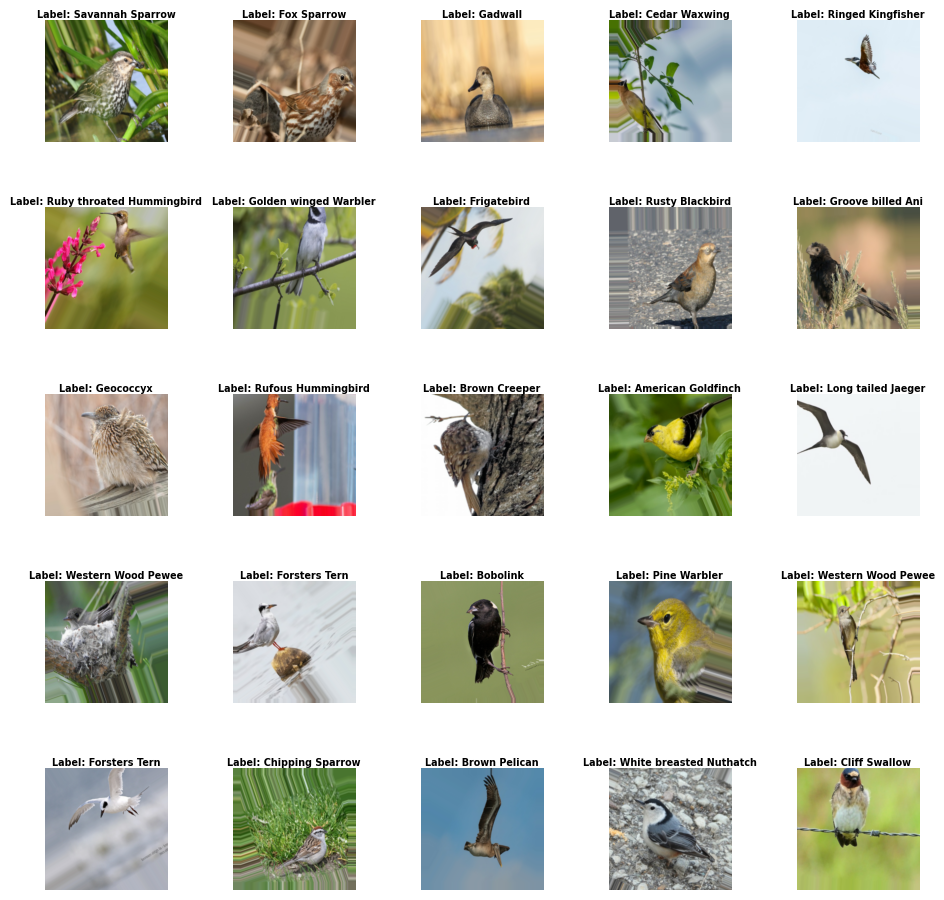

In [ ]:
# Some images from the training dataset after data augmentation
show_images(images, labels, random=False)

## **Model building and training**

To speed up the training time, Google's Colab TPU is used due to the large size of the model, which has about 200 million parameters. The model is loaded using the generic class [TFAutoModelForImageClassification](https://huggingface.co/docs/transformers/model_doc/auto#transformers.AutoModelForImageClassification), which allows for the loading of a ViT model available on Hugging Face by specifying only its name.

In [ ]:
# TPU setup

try:
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver(tpu="local")
  tf.config.experimental_connect_to_cluster(tpu)
  tf.tpu.experimental.initialize_tpu_system(tpu)
  strategy = tf.distribute.TPUStrategy(tpu)
  print("TPU initialized:")
  print("All devices: ", tf.config.list_logical_devices("TPU"))
except (ValueError, tf.errors.InvalidArgumentError, tf.errors.NotFoundError) as error:
  print(f"Error: {error}")

TPU initialized:
All devices:  [LogicalDevice(name='/device:TPU:0', device_type='TPU'), LogicalDevice(name='/device:TPU:1', device_type='TPU'), LogicalDevice(name='/device:TPU:2', device_type='TPU'), LogicalDevice(name='/device:TPU:3', device_type='TPU'), LogicalDevice(name='/device:TPU:4', device_type='TPU'), LogicalDevice(name='/device:TPU:5', device_type='TPU'), LogicalDevice(name='/device:TPU:6', device_type='TPU'), LogicalDevice(name='/device:TPU:7', device_type='TPU')]


In [ ]:
tf.keras.backend.clear_session()

with strategy.scope():
  model = TFAutoModelForImageClassification.from_pretrained(
      model_name,
      num_labels=num_classes,
      ignore_mismatched_sizes=True
  )

  optimizer, lr_schedule = create_optimizer(
      init_lr=3e-5,
      num_train_steps=len(train_dataset)*epochs,
      weight_decay_rate=0.01,
      num_warmup_steps=0
  )
  model.compile(
      optimizer=optimizer,
      loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
      metrics=[tf.keras.metrics.SparseCategoricalAccuracy(name="accuracy")],
      steps_per_execution=100
  )

model.summary()

All model checkpoint layers were used when initializing TFConvNextV2ForImageClassification.

Some weights of TFConvNextV2ForImageClassification were not initialized from the model checkpoint at facebook/convnextv2-large-22k-384 and are newly initialized because the shapes did not match:
- classifier/kernel:0: found shape (1536, 1000) in the checkpoint and (1536, 200) in the model instantiated
- classifier/bias:0: found shape (1000,) in the checkpoint and (200,) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Model: "tf_conv_next_v2_for_image_classification"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 convnextv2 (TFConvNextV2Ma  multiple                  196419840 
 inLayer)                                                        
                                                                 
 classifier (Dense)          multiple                  307400    
                                                                 
Total params: 196727240 (750.45 MB)
Trainable params: 196727240 (750.45 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
# Callback to stop training early if validation accuracy does not improve for 1 epoch
patience = 1
callback = tf.keras.callbacks.EarlyStopping(
    monitor="val_accuracy",
    patience=patience,
    restore_best_weights=True
)

In [ ]:
# Train the model
history = model.fit(train_dataset, epochs=epochs, validation_data=test_dataset, callbacks=[callback])

Epoch 1/5
813/813 [==============================] - 824s 1s/step - loss: 0.9272 - accuracy: 0.8259 - val_loss: 0.3937 - val_accuracy: 0.9051
Epoch 2/5
813/813 [==============================] - 290s 357ms/step - loss: 0.1573 - accuracy: 0.9596 - val_loss: 0.3691 - val_accuracy: 0.9149
Epoch 3/5
813/813 [==============================] - 290s 357ms/step - loss: 0.0850 - accuracy: 0.9790 - val_loss: 0.3556 - val_accuracy: 0.9234
Epoch 4/5
813/813 [==============================] - 290s 357ms/step - loss: 0.0549 - accuracy: 0.9870 - val_loss: 0.3464 - val_accuracy: 0.9268
Epoch 5/5
813/813 [==============================] - 290s 357ms/step - loss: 0.0341 - accuracy: 0.9927 - val_loss: 0.3377 - val_accuracy: 0.9304


**Save the model**

In [ ]:
trained_model_path = "/content/drive/MyDrive/models/Fine-Grained_ImageClassification_ConvNeXTV2_CUB-200-2011_eBird"
model.save_pretrained(trained_model_path)

## **Model Evaluation**

In [ ]:
print(model.evaluate(train_dataset, verbose=0))
print(model.evaluate(test_dataset, verbose=0))

[0.02753758616745472, 0.9939205050468445]
[0.33765241503715515, 0.9304453134536743]


### **Graphs of the metrics**

In [ ]:
# Library needed to convert Plotly interactive graphics into images
!pip install kaleido -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 13.1 MB/s eta 0:00:00


In [ ]:
# Function to plot the metrics
def plot_metrics(history=history.history, metric="loss", renderer=None, with_patience=False):
  epochs = len(history["loss"])
  losses = history[metric]
  val_losses = history[f"val_{metric}"]
  list_epochs = np.arange(1, epochs+1)
  metric = " ".join([w.capitalize() for w in metric.split("_")])

  fig=go.Figure()
  fig.add_trace(go.Scatter(x=list_epochs, y=losses, name=metric, line=dict(color="blue", width=2)))
  fig.add_trace(go.Scatter(x=list_epochs, y=val_losses, name=f"Val {metric}", line=dict(color="#FF6600", width=2)))

  last_epoch = epochs-patience if with_patience else epochs
  fig.add_vline(
      x=last_epoch, line=dict(color="red", width=2, dash="dash"),
      annotation_text="End of Training", annotation_position="top left",
      annotation=dict(font_size=12, font_color="red")
  )

  fig.update_xaxes(title_text="Epoch")
  fig.update_yaxes(title_text=metric)
  fig.update_layout(title=f"Evolution of {metric} across Epochs",
                    title_font=dict(size=20),
                    title_x=0.5,
                    height=500,
                    width=1200)

  fig.show(renderer)

In [ ]:
# Interactive graphic
plot_metrics(metric="accuracy")
plot_metrics()

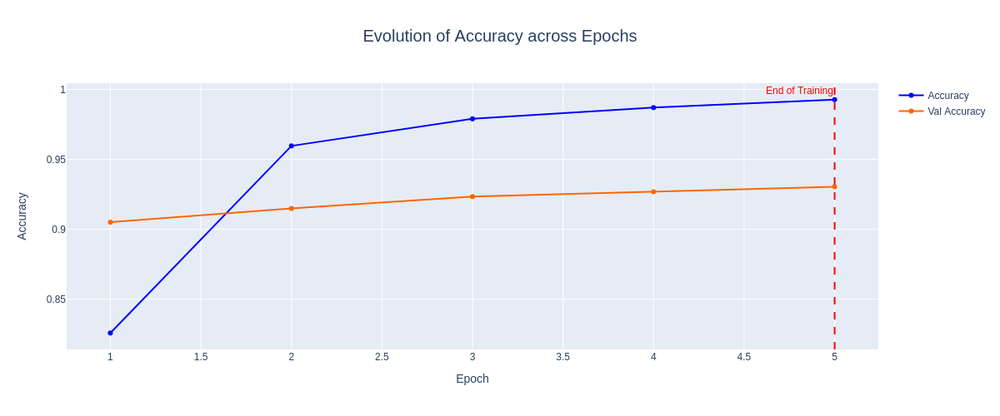

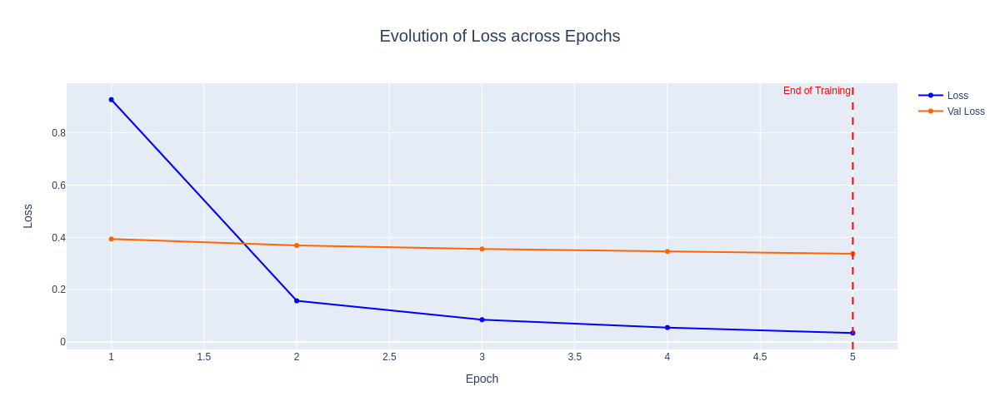

In [ ]:
# Static image for GitHub
plot_metrics(metric="accuracy", renderer="png")
plot_metrics(renderer="png")

### **Confusion Matrix**

In [ ]:
# Extract labels from the test dataset
labels_test = test_dataset.unbatch().map(lambda image, label: label)
labels_test = np.array(list(labels_test.as_numpy_iterator()))

# Generate predictions with the trained model
labels_test_pred = model.predict(test_dataset, verbose=0).logits
labels_test_pred = np.argmax(labels_test_pred, axis=-1)

# Consolidating the accuracy of the test dataset
print("Accuracy:", np.mean(labels_test == labels_test_pred))
print(f"F1 Score: {f1_score(labels_test, labels_test_pred, average='macro')}")

Accuracy: 0.9304452882292026
F1 Score: 0.9305202101113579


In [ ]:
cm = confusion_matrix(labels_test, labels_test_pred)
cmd = ConfusionMatrixDisplay(cm, display_labels=class_names)
fig, ax = plt.subplots(figsize=(35, 35))
cmd.plot(ax=ax, colorbar=False, cmap="coolwarm_r", xticks_rotation="vertical")

for text in ax.texts:
  text.set_fontsize(9)

ax.tick_params(axis="x", labelsize=8)
ax.tick_params(axis="y", labelsize=8)
plt.tight_layout()
fig.savefig("ConfusionMatrix_ConvNeXTV2_CUB-200-2011_eBird.svg", format="svg")
plt.close()

Since the dataset contains many classes (200 in total), the confusion matrix does not display optimally within this notebook. Therefore, it is saved in SVG format for clear visualization in a web browser via the following [**link**](https://raw.githubusercontent.com/JersonGB22/ImageClassification-TensorFlow/main/images/images_models/ConfusionMatrix_ConvNeXTV2_CUB-200-2011_eBird.svg). Additionally, evaluation results are presented in a Pandas DataFrame to provide a more detailed and clear view.

In [ ]:
# Create the DataFrame with the most relevant variables for analysis
frequency = np.unique(labels_test, return_counts=True)[1]
correct_predictions = np.diag(cm)

df = pd.DataFrame({
    "Class": class_names,
    "Frequency": frequency,
    "Correct Predictions": correct_predictions,
    "Accuracy (%)": [round(per*100, 2) for per in correct_predictions/frequency]
})

# Sort the DataFrame in descending order according to accuracy
df = df.sort_values(by="Accuracy (%)", ascending=False)
#df

View the evaluation results of the test dataset by dividing the DataFrame into 4 parts to enhance clarity:

In [ ]:
df.iloc[:50]

,Class,Frequency,Correct Predictions,Accuracy (%)
7,Rhinoceros Auklet,18,18,100.0
6,Parakeet Auklet,23,23,100.0
185,Cedar Waxwing,30,30,100.0
105,Horned Puffin,30,30,100.0
108,American Redstart,30,30,100.0
109,Geococcyx,30,30,100.0
114,Brewer Sparrow,29,29,100.0
194,Carolina Wren,30,30,100.0
16,Cardinal,27,27,100.0
17,Spotted Catbird,15,15,100.0


In [ ]:
df.iloc[50:100]

,Class,Frequency,Correct Predictions,Accuracy (%)
150,Black capped Vireo,21,21,100.00
133,Cape Glossy Starling,30,30,100.00
135,Barn Swallow,30,30,100.00
82,White breasted Kingfisher,30,30,100.00
83,Red legged Kittiwake,23,23,100.00
84,Horned Lark,30,30,100.00
85,Pacific Loon,30,30,100.00
86,Mallard,30,30,100.00
67,Ruby throated Hummingbird,30,30,100.00
69,Green Violetear,30,30,100.00


In [ ]:
df.iloc[100:150]

,Class,Frequency,Correct Predictions,Accuracy (%)
37,Great Crested Flycatcher,30,29,96.67
39,Olive sided Flycatcher,30,29,96.67
160,Blue winged Warbler,30,29,96.67
162,Cape May Warbler,30,29,96.67
102,Sayornis,30,29,96.67
103,American Pipit,30,29,96.67
122,Henslow Sparrow,30,29,96.67
25,Bronzed Cowbird,30,29,96.67
170,Myrtle Warbler,30,29,96.67
173,Palm Warbler,30,29,96.67


In [ ]:
df.iloc[150:]

,Class,Frequency,Correct Predictions,Accuracy (%)
171,Nashville Warbler,30,27,90.00
98,Ovenbird,30,27,90.00
127,Seaside Sparrow,30,27,90.00
142,Caspian Tern,30,27,90.00
64,Slaty backed Gull,20,18,90.00
137,Tree Swallow,30,27,90.00
174,Pine Warbler,30,27,90.00
152,Philadelphia Vireo,29,26,89.66
124,Lincoln Sparrow,29,26,89.66
31,Mangrove Cuckoo,23,20,86.96


In [ ]:
# Check if the test dataset is balanced
df.Frequency.sort_values()

,Frequency
5,11
4,14
17,15
7,18
104,19
...,...
10,30
61,30
20,30
176,30


In [ ]:
# Due to decimal rounding, the average accuracy reported by the DataFrame may differ slightly
df["Accuracy (%)"].mean()

93.1513

It can be seen that the test dataset is not balanced, with the number of images ranging from 11 to 30 per class. On the other hand, the fine-tuned model demonstrates exceptional performance: it achieves **100%** accuracy in over **80** classes, **90%** or higher accuracy in **157** classes, and only **17** classes have accuracy below **80%**, with the lowest accuracy being **40%** for the ``California Gull``. This indicates that the model is performing excellently, considering the fine-grained image classification task, which involves distinguishing between bird species that can be nearly identical, adding complexity to the task.

## **Predictions with the trained model**

### **Test dataset**

In [ ]:
# Extract images from the test dataset
images_test = test_dataset.unbatch().map(lambda image, label: image)
images_test = np.array(list(images_test.as_numpy_iterator()))

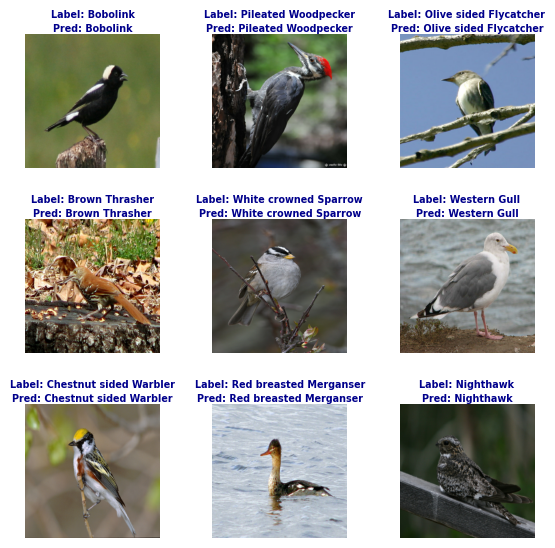

In [ ]:
show_images(images_test, labels_test, labels_test_pred, num_examples=9)

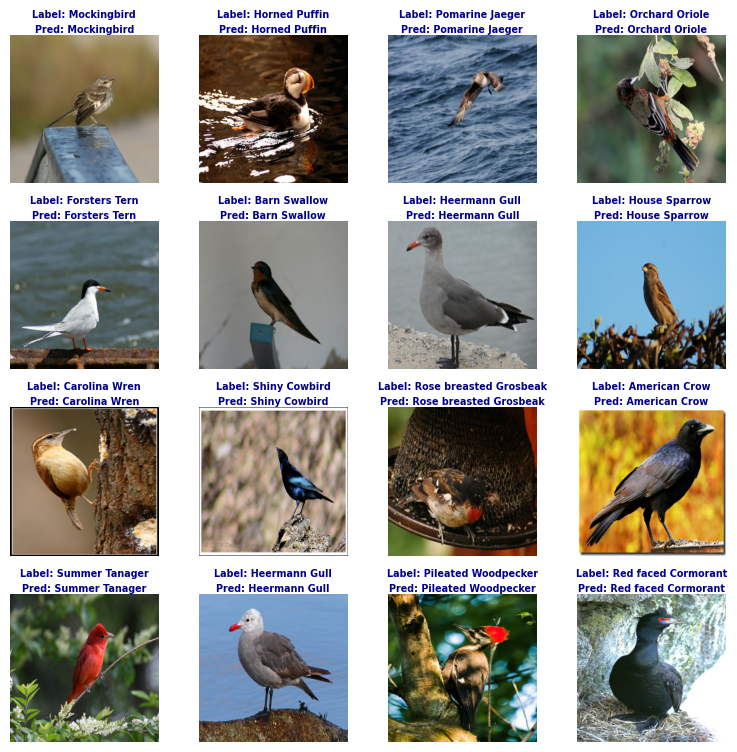

In [ ]:
show_images(images_test, labels_test, labels_test_pred, num_examples=16)

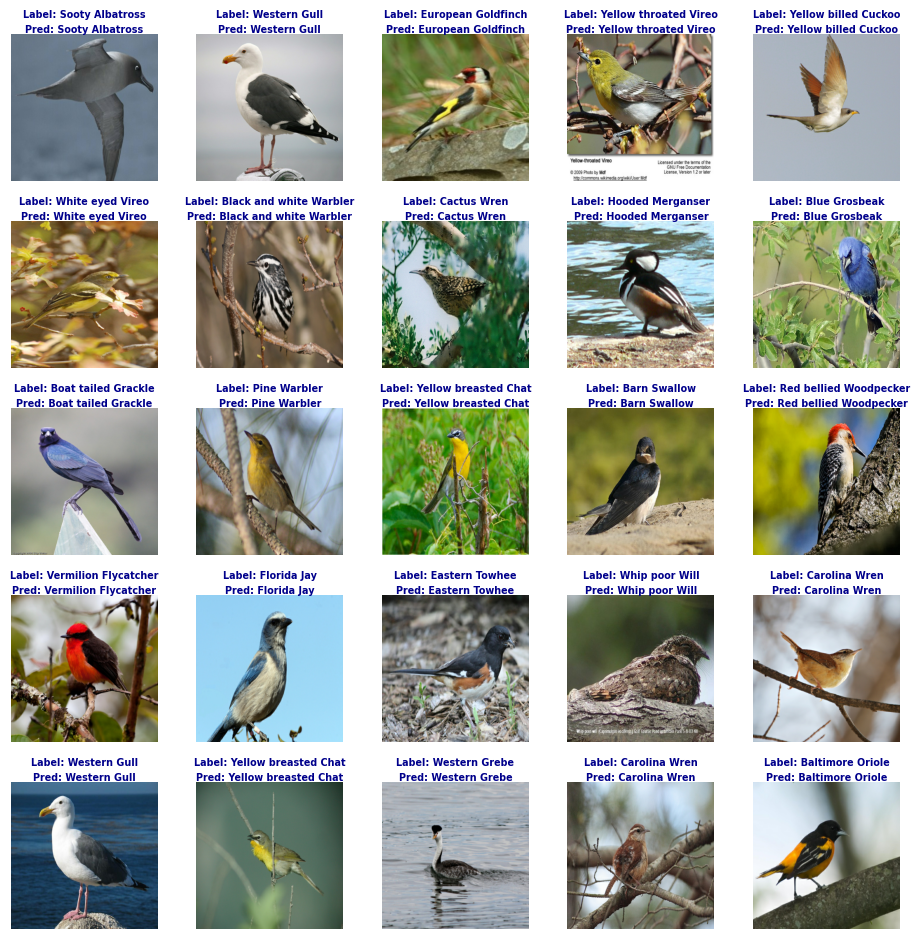

In [ ]:
show_images(
    images_test, labels_test, labels_test_pred, save=True,
    path="ImageClassification_ConvNeXTV2_CUB-200-2011_eBird.png"
)

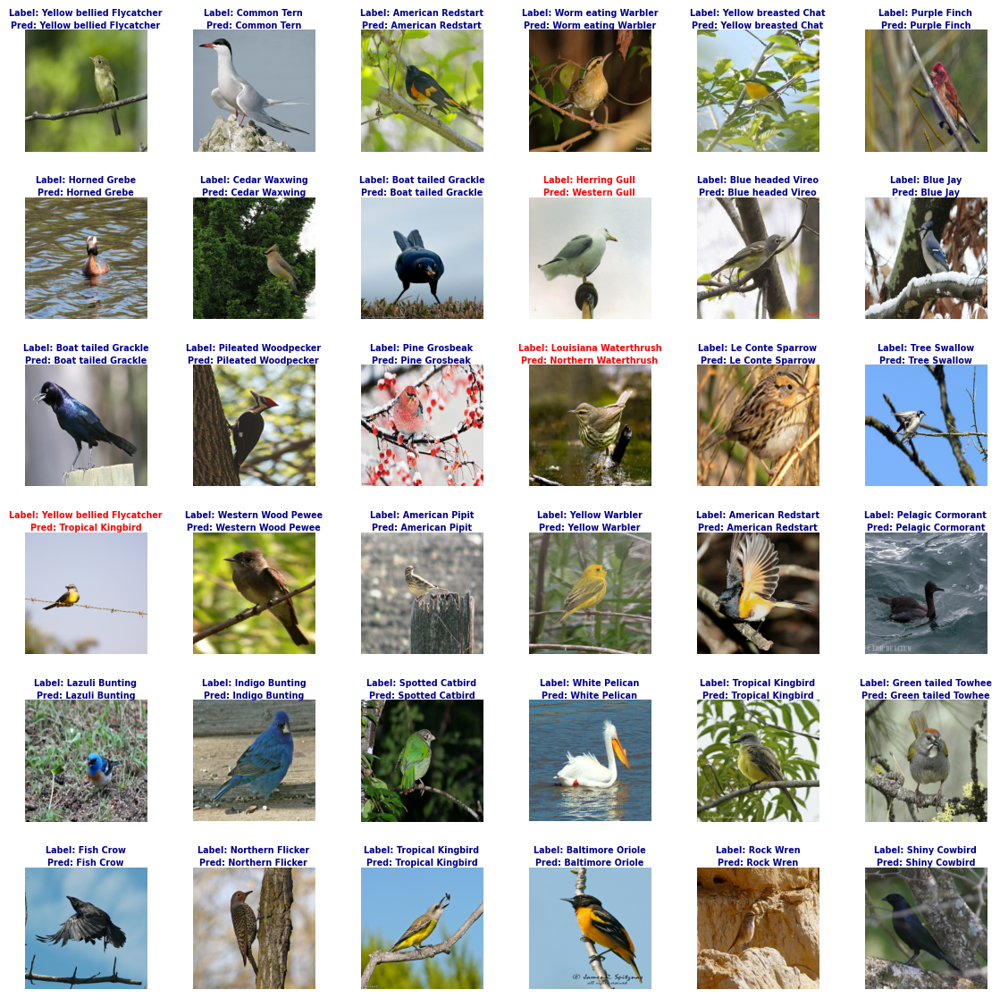

In [ ]:
# The image below shows some incorrect predictions
show_images(images_test, labels_test, labels_test_pred, num_examples=36)

### **Other images**

In [ ]:
# Load the trained model
tf.keras.backend.clear_session()
model = TFAutoModelForImageClassification.from_pretrained(trained_model_path)

All model checkpoint layers were used when initializing TFConvNextV2ForImageClassification.

All the layers of TFConvNextV2ForImageClassification were initialized from the model checkpoint at /content/drive/MyDrive/models/Fine-Grained_ImageClassification_ConvNeXTV2_CUB-200-2011_eBird.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFConvNextV2ForImageClassification for predictions without further training.


In [ ]:
# Function to predict images from the internet
def predict_image(url, label=None):
  path = tf.keras.utils.get_file(origin=url)
  image = tf.keras.utils.load_img(path)
  inputs = image_processor(image, return_tensors="tf")

  pred = model(**inputs).logits
  pred = np.argmax(pred, axis=-1)
  pred = class_names[pred[0]]

  if label is not None:
    color = "#00008B" if label == pred else "red"
    plt.title(f"Label: {label}\nPred: {pred}", color=color)
  else:
    plt.title(f"Pred: {pred}")

  plt.imshow(image)
  plt.axis("off")
  plt.tight_layout();

731434/731434 [==============================] - 0s 0us/step


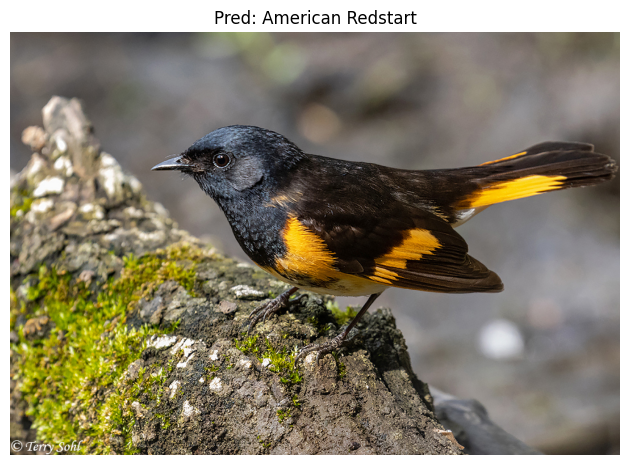

In [ ]:
url = "https://www.sdakotabirds.com/species_photos/warblers/american_redstart_16.jpg"
#label = "American Redstart"

predict_image(url)

107237/107237 [==============================] - 0s 0us/step


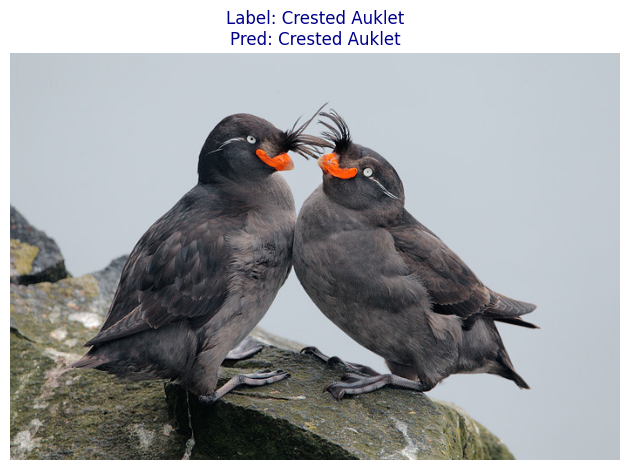

In [ ]:
url = "https://64.media.tumblr.com/a6505cd68cbf41195cb26d9efb20d13d/tumblr_inline_omb9gefMVo1s3cybu_1280.jpg"
label = "Crested Auklet"

predict_image(url, label)

217833/217833 [==============================] - 0s 1us/step


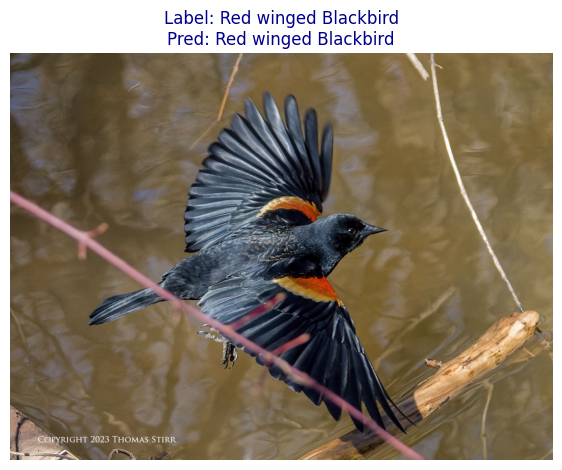

In [ ]:
url = "https://smallsensorphotography.com/wordpress/wp-content/uploads/2023/05/4090193_DxO3909wprocapH1200.jpg"
label = "Red winged Blackbird"

predict_image(url, label)

140449/140449 [==============================] - 0s 3us/step


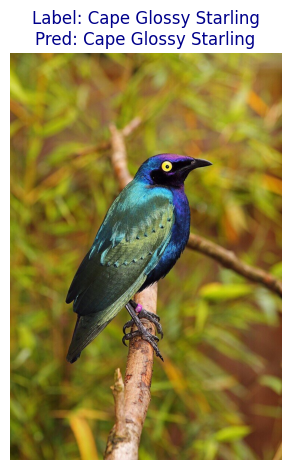

In [ ]:
url = "https://media01.stockfood.com/largepreviews/MjIwMjU5MTU0MA==/71051340-Cape-Starling-Cape-Glossy-Starling-Lamprotornis-nitens-a-species-of-starling-in-the-Sturnidae-family-South.jpg"
label = "Cape Glossy Starling"

predict_image(url, label)

73736/73736 [==============================] - 0s 1us/step


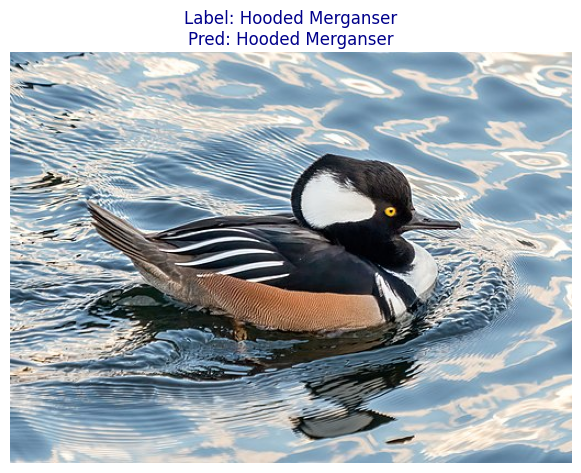

In [ ]:
url = "https://upload.wikimedia.org/wikipedia/commons/thumb/7/70/Hooded_merganser_male_in_Central_Park_%2895790%29.jpg/512px-Hooded_merganser_male_in_Central_Park_%2895790%29.jpg"
label = "Hooded Merganser"

predict_image(url, label)

   8192/Unknown - 0s 0us/step

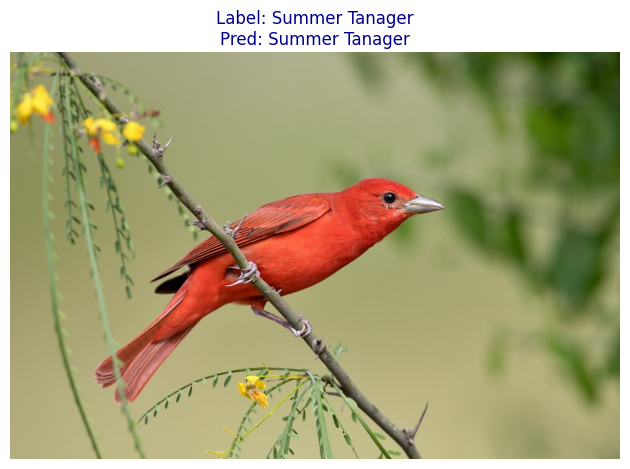

In [ ]:
url = "https://live.staticflickr.com/65535/47057120154_e3fa046c41_b.jpg"
label = "Summer Tanager"

predict_image(url, label)

469389/469389 [==============================] - 0s 0us/step


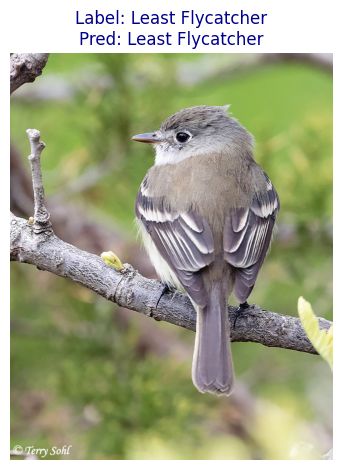

In [ ]:
url = "https://www.sdakotabirds.com/species_photos/flycatchers/least_flycatcher_8.jpg"
label = "Least Flycatcher"

predict_image(url, label)

143641/143641 [==============================] - 0s 1us/step


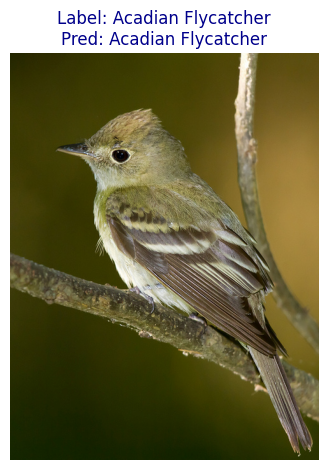

In [ ]:
url = "https://objects.liquidweb.services/images/201407/frode_jacobsen_7467757054_98545d8fdf_z.jpg"
label = "Acadian Flycatcher"

predict_image(url, label)

10700/10700 [==============================] - 0s 0us/step


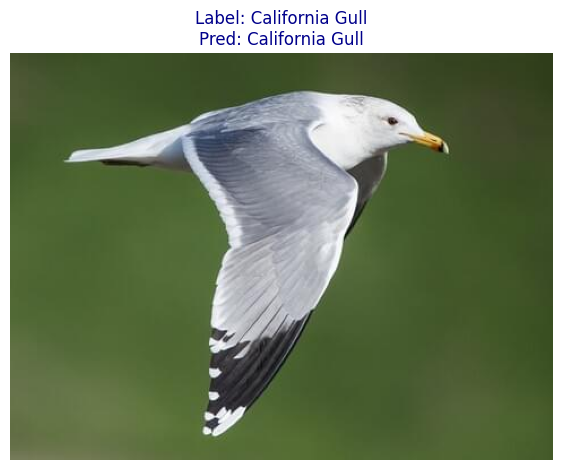

In [ ]:
url = "https://www.allaboutbirds.org/guide/assets/photo/303379871-480px.jpg"
label = "California Gull"

predict_image(url, label)

**Conclusion:** The model achieved an accuracy of **99.39%** on the training dataset and an accuracy of **93.04%** along with an F1 score of **93.05%** on the test dataset. These results demonstrate that the model is effective for classifying images of the 200 bird species in the CUB-200-2011 dataset, including both test images from this dataset and external images, such as those from the internet, as shown in the predictions section. The slight discrepancy between accuracy and F1 score in the test dataset is due to the model's varying performance across different bird species and the imbalance in the test dataset. Despite the challenge posed by having many classes and a relatively limited number of images for fine-tuning the ConvNeXt V2 Large model, it maintains a good balance between precision and recall.

Furthermore, there is a notable improvement compared to using only the CUB-200-2011 dataset for training, where an accuracy of **91.65%** was achieved on the test dataset. This indicates that adding additional images from the eBird website to the CUB-200-2011 training set was highly effective.

Although data augmentation techniques were employed, overfitting is still evident, likely due to the small size of the test dataset, its imbalance, and the similarity between some bird species. For fine-grained image classification, additional textual information is typically used along with images to achieve better results. Moreover, if training had continued for more epochs, the training accuracy might have reached 100%, while the test accuracy could have begun to decrease or plateau.

With an accuracy of **93.04%** on the test dataset, the fine-tuned model would currently be in first place, surpassing the MetaFormer model, which has the highest results on the CUB-200-2011 dataset with an accuracy of **92.9%**, according to [Papers With Code](https://paperswithcode.com/sota/fine-grained-image-classification-on-cub-200). This highlights the robustness of the ConvNeXt V2 model, the effectiveness of the fine-tuning performed in this notebook, and the efficacy of using data augmentation before and during training.